# Fastdup Tutorial

[Visit our GitHub Project Page](https://github.com/visualdatabase/fastdup)

## Install fastdup

In [1]:
!pip install -U fastdup

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import fastdup

In [3]:
fastdup.__version__

'0.92'

## Download the food-101 dataset

Note that this dataset contains 101,000 images, we can run fully analyze it with fastdup on a weak Colab free notebook in about 10 minutes using a single core, without a GPU! If you like to speed up the execution you should switch to a stronger machine.

In [4]:
!wget http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz

--2022-06-20 08:46:58--  http://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
Resolving data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)... 129.132.52.178, 2001:67c:10ec:36c2::178
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://data.vision.ee.ethz.ch/cvl/food-101.tar.gz [following]
--2022-06-20 08:46:58--  https://data.vision.ee.ethz.ch/cvl/food-101.tar.gz
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4996278331 (4.7G) [application/x-gzip]
Saving to: ‘food-101.tar.gz.1’

food-101.tar.gz.1    94%[=================>  ]   4.40G  30.0MB/s    eta 10s    ^C


In [5]:
!tar xzf food-101.tar.gz


gzip: stdin: unexpected end of file
tar: Unexpected EOF in archive
tar: Unexpected EOF in archive
tar: Error is not recoverable: exiting now


## Run fastdup to gain insights from your data

In [16]:
fastdup.run('food-101', num_images=10000)

FastDup Software, (C) copyright 2022 Dr. Amir Alush and Dr. Danny Bickson.
On Jupyter notebook running on large datasets, there may be delay getting the console output. We recommend running using python shell.
Going to loop over dir food-101
Found total 10000 images to run on
[■                                                 ] 1% Estimated: 0 Minutes
[■                                                 ] 1% Estimated: 0 Minutes
[■                                                 ] 1% Estimated: 0 Minutes
[■                                                 ] 1% Estimated: 0 Minutes
[■                                                 ] 2% Estimated: 1 Minutes
[■                                                 ] 2% Estimated: 1 Minutes
[■                                                 ] 2% Estimated: 1 Minutes
[■■                                                ] 2% Estimated: 1 Minutes
[■■                                                ] 3% Estimated: 1 Minutes
[■■                           

In [7]:
fastdup.create_duplicates_gallery('similarity.csv',save_path='.', num_images=20)

100%|██████████| 20/20 [00:00<00:00, 42.59it/s]


Stored similarity visual view in  ./similarity.html


,Image,Distance,From,To
0,,1.000000,food-101/images/hamburger/3783650.jpg,food-101/images/hamburger/3783650.jpg
1,,1.000000,food-101/images/prime_rib/721232.jpg,food-101/images/prime_rib/721245.jpg
2,,1.000000,food-101/images/hamburger/3578279.jpg,food-101/images/hamburger/3783650.jpg
3,,1.000000,food-101/images/chicken_wings/820377.jpg,food-101/images/chicken_wings/834669.jpg
4,,1.000000,food-101/images/prime_rib/721245.jpg,food-101/images/prime_rib/721245.jpg
5,,1.000000,food-101/images/chicken_wings/834669.jpg,food-101/images/chicken_wings/834669.jpg
6,,1.000000,food-101/images/beignets/1996069.jpg,food-101/images/beignets/1997437.jpg
7,,1.000000,food-101/images/greek_salad/857079.jpg,food-101/images/greek_salad/862426.jpg
8,,1.000000,food-101/images/beignets/1997437.jpg,food-101/images/beignets/1997437.jpg
9,,1.000000,food-101/images/greek_salad/862426.jpg,food-101/images/greek_salad/862426.jpg

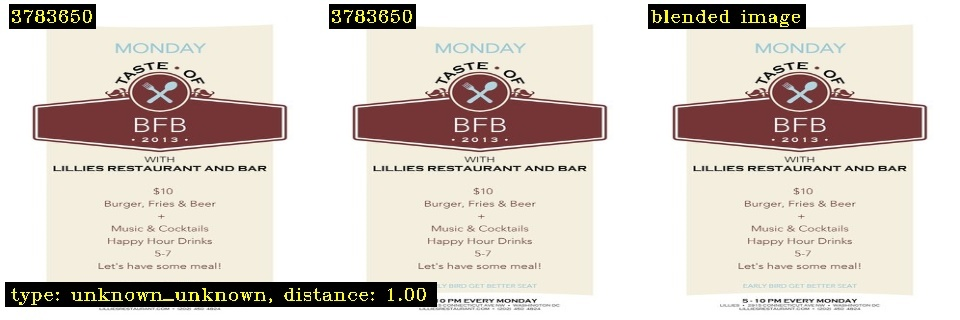
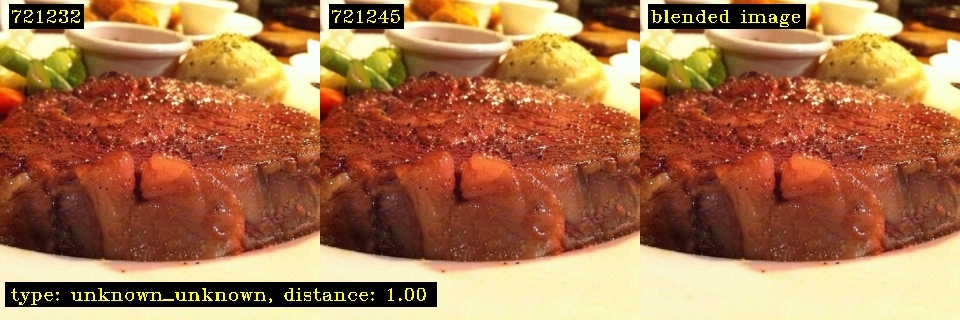
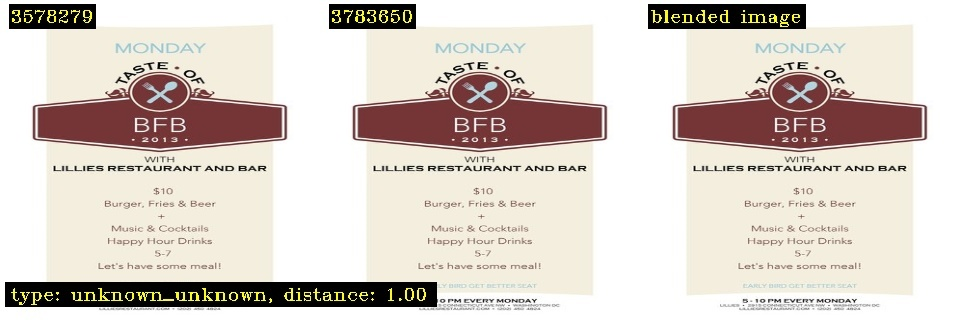
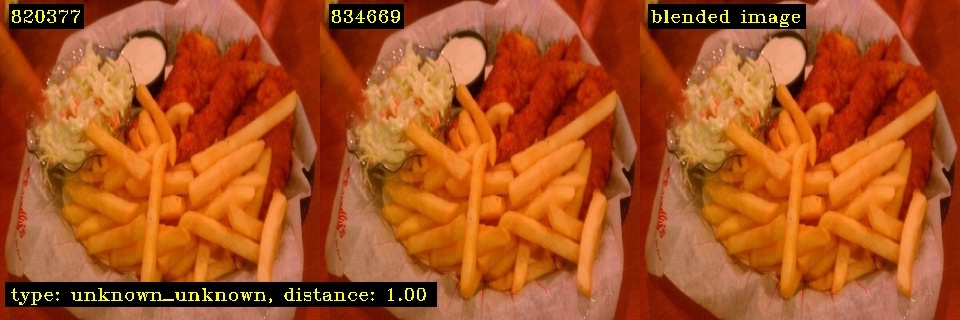
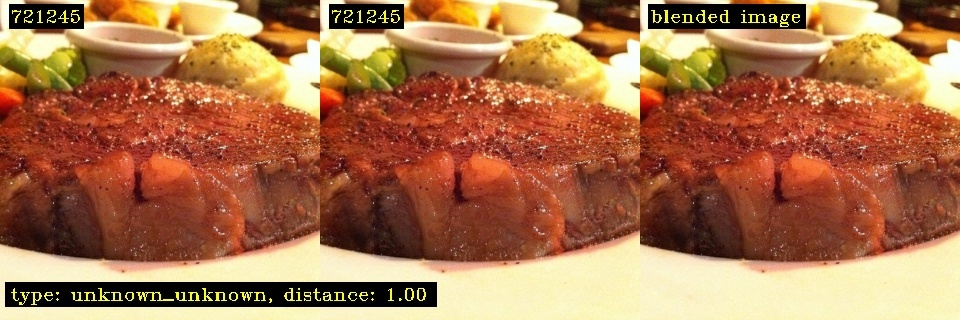
...
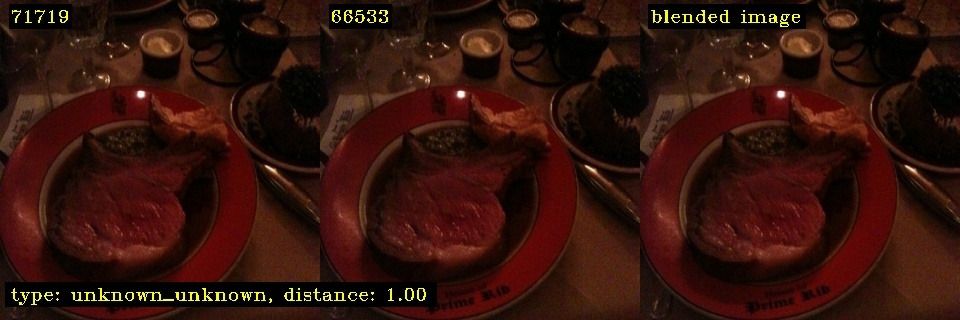
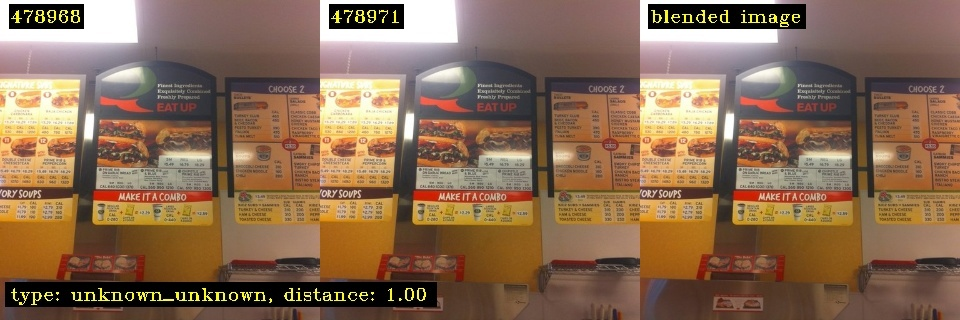
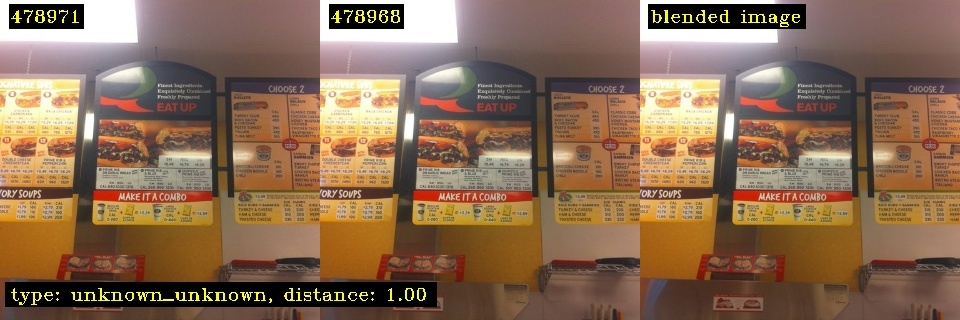
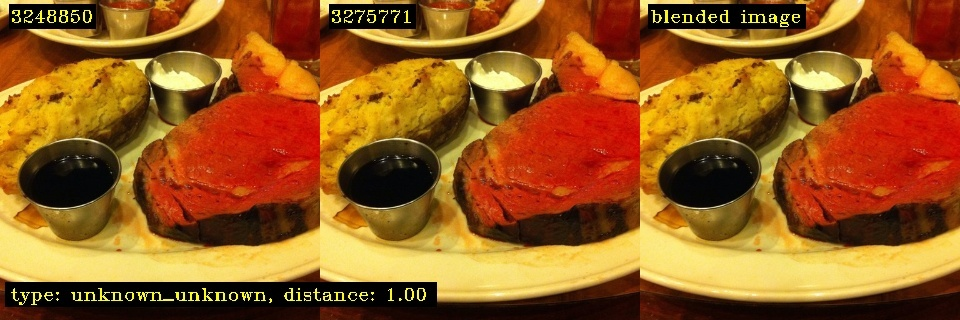
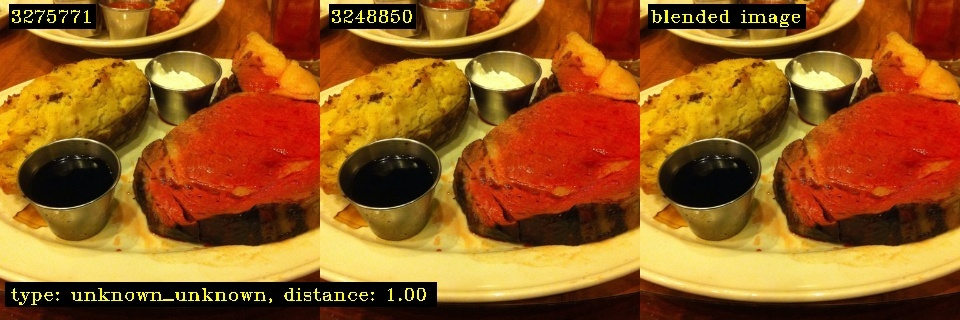

In [8]:
from IPython.display import HTML
HTML('similarity.html')

In [9]:
fastdup.create_outliers_gallery('outliers.csv',save_path='.', num_images=20)

100%|██████████| 20/20 [00:00<00:00, 72.74it/s]


Stored outliers visual view in  ./outliers.html


,Image,Distance,Path
999,,0.503477,food-101/images/pizza/329302.jpg
998,,0.512760,food-101/images/prime_rib/587532.jpg
997,,0.519463,food-101/images/pizza/329302.jpg
996,,0.533203,food-101/images/prime_rib/587532.jpg
995,,0.539900,food-101/images/beignets/3568316.jpg
994,,0.541008,food-101/images/bruschetta/1883187.jpg
993,,0.553300,food-101/images/beignets/3568316.jpg
992,,0.555938,food-101/images/hamburger/1608876.jpg
991,,0.565396,food-101/images/hamburger/1608876.jpg
990,,0.566393,food-101/images/hamburger/806392.jpg

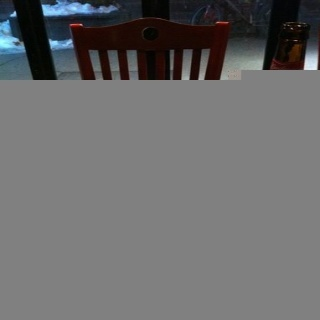
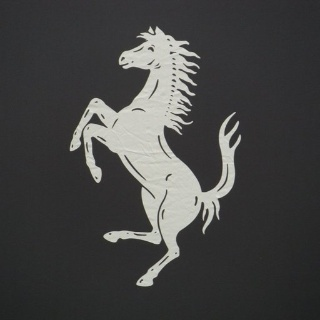
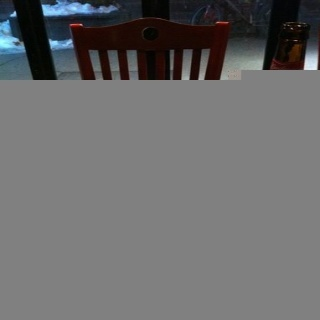
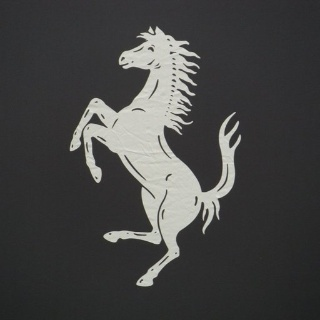
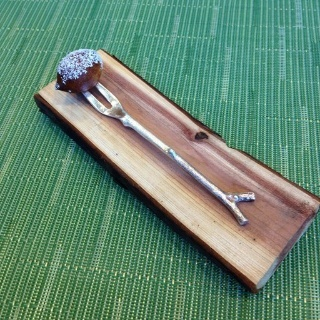
...
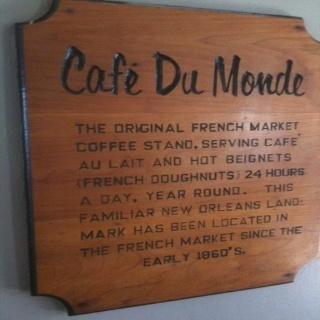
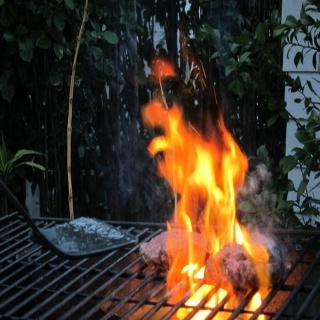
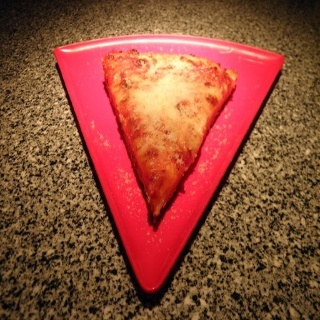
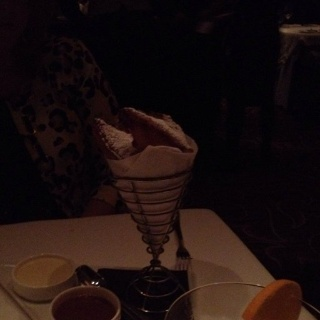
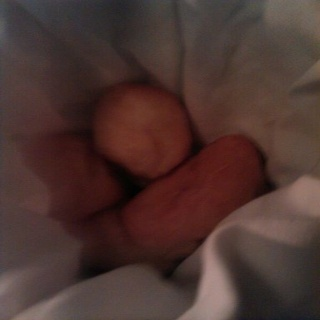

In [10]:
HTML('outliers.html')

## Perform graph analytics to find connected components of images

Connected components are clusters of similar images. In the code below we find the largest clusters of duplicate images and visualize them.

100%|██████████| 20/20 [00:04<00:00,  4.67it/s]


Finished OK. Components are stored as image files components{i}.png


100%|██████████| 20/20 [00:00<00:00, 49.06it/s]


Stored components visual view in  ./components.html


,component_id,num_images,image
0,4713,2,
1,3820,2,
2,3603,2,
3,1891,2,
4,851,2,
5,5686,2,
6,6622,2,
7,6916,2,
8,1813,2,
9,2905,2,

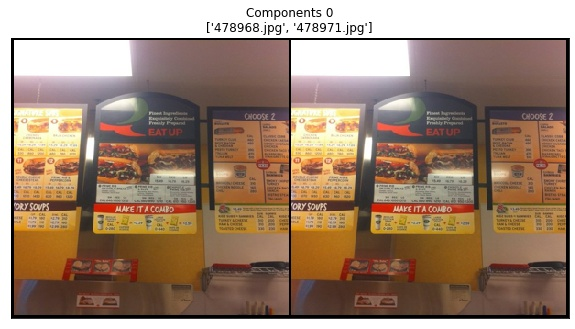
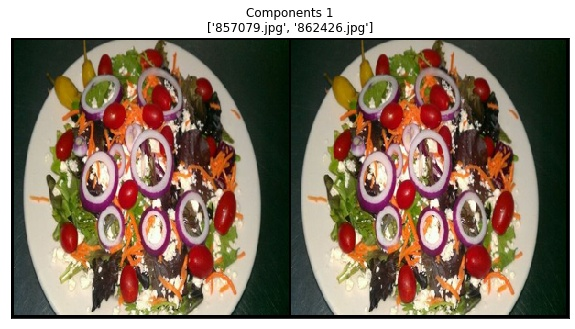
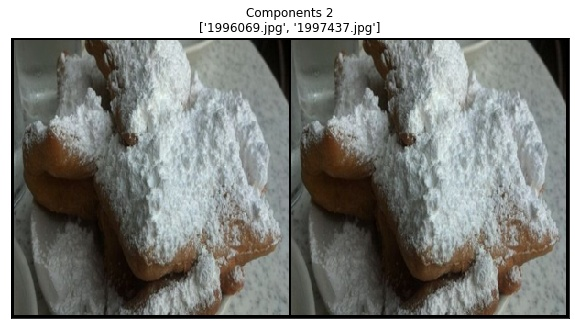
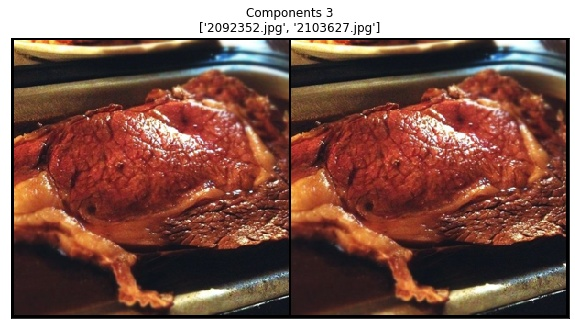
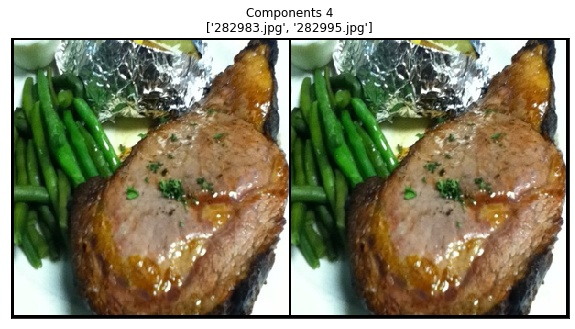
...
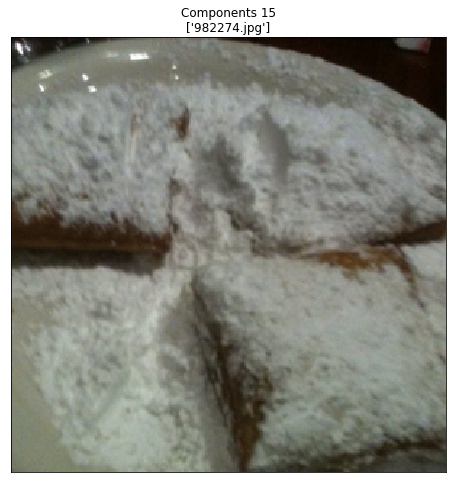
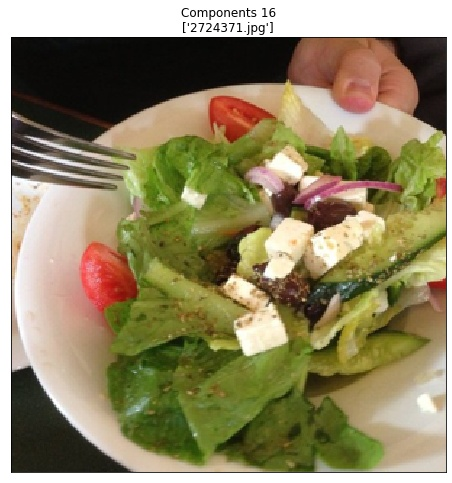
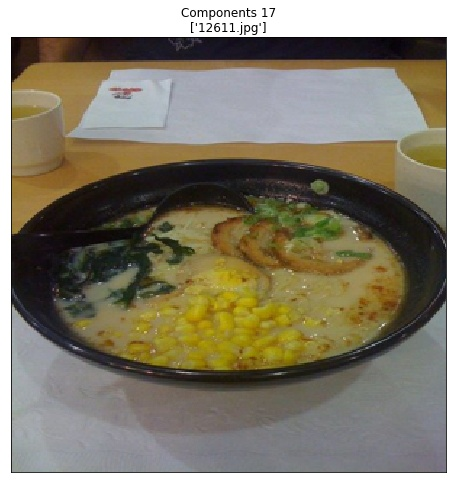
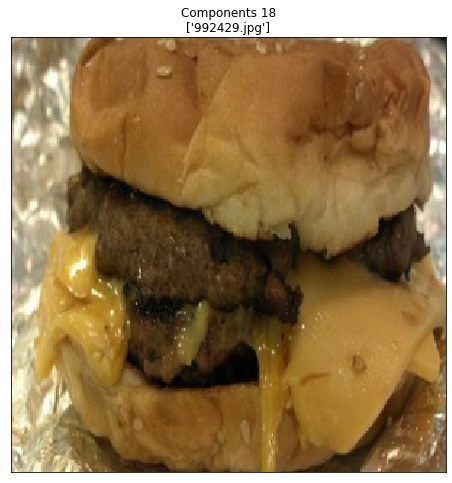
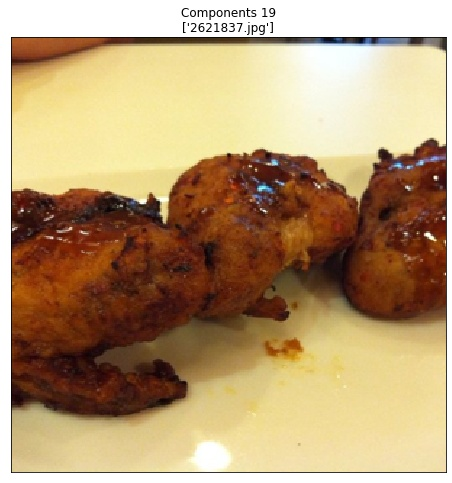

<Figure size 432x288 with 0 Axes>

In [11]:
fastdup.create_components_gallery('.','.')
HTML('./components.html')

# Visualize the results with TensorBoard Projector

In [12]:
fastdup.export_to_tensorboard_projector('.','tmp4',900, get_label_func=lambda x:x.split('/')[2])

Read a total of  10000 images


100%|██████████| 900/900 [00:12<00:00, 72.15it/s]


Finish exporting to tensorboard projector, now run
%load_ext tensorboard
%tensorboard --logdir=tmp4


In [13]:
%load_ext tensorboard


Note: sometimes tensorboard does not boot up on the first call, try to run again in case you see the message "No dashboards are active for the current data set." 

In [14]:
%tensorboard --logdir=tmp4

<IPython.core.display.Javascript object>